# Income prediction based on US census data


## Problem Type
The dependent variable for prediction is the 'income' feature that has two discrete categories of income higher than 50k and less than or equal to 50k. The problem is thus a Supervised Binary Classification type.

## Approach
The dataset contains 32561 rows and 15 features. I'll first explore the dataset with focus on distributions, then using the insights from raw data, I'll conduct data preprocessing. 
For modeling, I'll employ various supervised learning algorithms, and compare the results using f1 score.

### Step 1: Import libraries and dataset
Standard libraries such as pandas, numpy, matplotlib, and seaborn are imported. Pandas is used for dataframe, numpy for algebra operations, and matplotlib and seaborn for plotting charts.

In [1]:
import warnings
warnings.filterwarnings('ignore')
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns

## 1. Import the dataset

In [2]:
# load the data
data= pd.read_csv('census.csv')

## 2. Exploratory Data Analysis

In [3]:
data.head()

,age,workclass,fnlwgt,education,education.num,marital.status,occupation,relationship,race,sex,capital.gain,capital.loss,hours.per.week,native.country,income
0,90,?,77053,HS-grad,9,Widowed,?,Not-in-family,White,Female,0,4356,40,United-States,<=50K
1,82,Private,132870,HS-grad,9,Widowed,Exec-managerial,Not-in-family,White,Female,0,4356,18,United-States,<=50K
2,66,?,186061,Some-college,10,Widowed,?,Unmarried,Black,Female,0,4356,40,United-States,<=50K
3,54,Private,140359,7th-8th,4,Divorced,Machine-op-inspct,Unmarried,White,Female,0,3900,40,United-States,<=50K
4,41,Private,264663,Some-college,10,Separated,Prof-specialty,Own-child,White,Female,0,3900,40,United-States,<=50K


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32561 entries, 0 to 32560
Data columns (total 15 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   age             32561 non-null  int64 
 1   workclass       32561 non-null  object
 2   fnlwgt          32561 non-null  int64 
 3   education       32561 non-null  object
 4   education.num   32561 non-null  int64 
 5   marital.status  32561 non-null  object
 6   occupation      32561 non-null  object
 7   relationship    32561 non-null  object
 8   race            32561 non-null  object
 9   sex             32561 non-null  object
 10  capital.gain    32561 non-null  int64 
 11  capital.loss    32561 non-null  int64 
 12  hours.per.week  32561 non-null  int64 
 13  native.country  32561 non-null  object
 14  income          32561 non-null  object
dtypes: int64(6), object(9)
memory usage: 3.7+ MB


In [5]:
#statistical summary
data.describe().T

,count,mean,std,min,25%,50%,75%,max
age,32561.0,38.581647,13.640433,17.0,28.0,37.0,48.0,90.0
fnlwgt,32561.0,189778.366512,105549.977697,12285.0,117827.0,178356.0,237051.0,1484705.0
education.num,32561.0,10.080679,2.572720,1.0,9.0,10.0,12.0,16.0
capital.gain,32561.0,1077.648844,7385.292085,0.0,0.0,0.0,0.0,99999.0
capital.loss,32561.0,87.303830,402.960219,0.0,0.0,0.0,0.0,4356.0
hours.per.week,32561.0,40.437456,12.347429,1.0,40.0,40.0,45.0,99.0


In [6]:
#check for null values
((data.isnull().sum() / data.shape[0])*100).astype(str) + ' %'

age               0.0 %
workclass         0.0 %
fnlwgt            0.0 %
education         0.0 %
education.num     0.0 %
marital.status    0.0 %
occupation        0.0 %
relationship      0.0 %
race              0.0 %
sex               0.0 %
capital.gain      0.0 %
capital.loss      0.0 %
hours.per.week    0.0 %
native.country    0.0 %
income            0.0 %
dtype: object

In [7]:
#check for '?' value.
round((data.isin(["?"]).sum() / data.shape[0])*100, 2).astype(str) + ' %'

age                0.0 %
workclass         5.64 %
fnlwgt             0.0 %
education          0.0 %
education.num      0.0 %
marital.status     0.0 %
occupation        5.66 %
relationship       0.0 %
race               0.0 %
sex                0.0 %
capital.gain       0.0 %
capital.loss       0.0 %
hours.per.week     0.0 %
native.country    1.79 %
income             0.0 %
dtype: object

In [8]:
#Check the dependent variable category counts
income = data['income'].value_counts(normalize=True)    #0.75 vs. 0.25
round(income*100, 2).astype('str') + ' %'

<=50K    75.92 %
>50K     24.08 %
Name: income, dtype: object

Insights:
- The dataset shows no null values. However, three features (workclass, ocupation, native.country) contain '?' values that need to be preprocessed.
- The dependent feature 'income' contains 76% of its values with income equal to or less than 50k and 24% with income greater than 50k. The dataset is thus unbalanced.

In [9]:
print(data.columns)

Index(['age', 'workclass', 'fnlwgt', 'education', 'education.num',
       'marital.status', 'occupation', 'relationship', 'race', 'sex',
       'capital.gain', 'capital.loss', 'hours.per.week', 'native.country',
       'income'],
      dtype='object')


Details about the dataset

- age : continuous
- workclass : Includes (Private, Self-emp-not-inc, Self-emp-inc, Federal-gov, Local-gov, State-gov, Without-pay, Never-worked)
- fnlwgt : continous. Final Weight. The level of representativeness of an individual to the population (e.g. High score for a person with college degree and 1 kid vs. low score for a person who is divorced with 5 kids)
- education : Level of education (e.g. High School, College). Includes (Bachelors, Some-college, 11th, HS-grad, Prof-school, Assoc-acdm, Assoc-voc, 9th, 7th-8th, 12th, Masters, 1st-4th, 10th, Doctorate, 5th-6th, Preschool)
- education_num : continuous. Level of education in number of years (e.g. 9, 10)
- marital_status: Includes (Married-civ-spouse, Divorced, Never-married, Separated, Widowed, Married-spouse-absent, Married-AF-spouse).
- occupation : Inclues (Tech-support, Craft-repair, Other-service, Sales, Exec-managerial, Prof-specialty, Handlers-cleaners, Machine-op-inspct, Adm-clerical, Farming-fishing, Transport-moving, Priv-house-serv, Protective-serv, Armed-Forces)
- relationship : Includes (Wife, Own-child, Husband, Not-in-family, Other-relative, Unmarried)
- race : Includes (White, Asian-Pac-Islander, Amer-Indian-Eskimo, Other, Black)
- sex : Includes (Female, Male)
- capital_gain : continuous
- capital_loss : continuous
- hours_per_week : continuous
- native_country : Includes (United-States, Cambodia, England, Puerto-Rico, Canada, Germany, Outlying-US(Guam-USVI-etc), India, Japan, Greece, South, China, Cuba, Iran, Honduras, Philippines, Italy, Poland, Jamaica, Vietnam, Mexico, Portugal, Ireland, France, Dominican-Republic, Laos, Ecuador, Taiwan, Haiti, Columbia, Hungary, Guatemala, Nicaragua, Scotland, Thailand, Yugoslavia, El-Salvador, Trinadad&Tobago, Peru, Hong, Holand-Netherlands)
- income : Income level (need to convert to numerical variable). The 50000 USD income in 1994 is approxmiately 88180 USD income in 2020 (176/100*50000).
    - Greater than 50K : 1
    - Equal to or less than 50K : 0

#### (1) Income feature

Store the income variable in numerical format. The value 1 represents income greater than 50K and the value 0 represents income equal to or less than 50K.

In [10]:
data['income'] = data['income'].map(lambda x: 1 if x=='>50K' else 0)

In [11]:
data.income.value_counts()

0    24720
1     7841
Name: income, dtype: int64

#### (2) Age feature

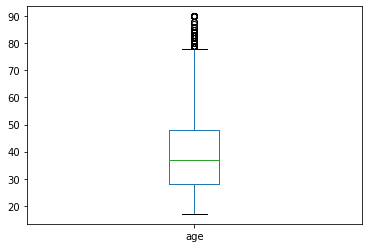

In [12]:
data.age.plot(kind='box')

Insights:
- Median age is around 35. The majority of the age values fall between 30s and 40s. There are outliers at age above 80.

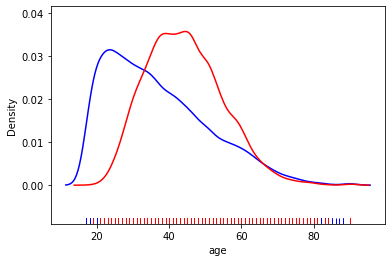

In [13]:
#Age vs. Income distribution chart
df1 = data.loc[data.income==0, 'age']
df2 = data.loc[data.income==1, 'age']
sns.distplot(df1, kde=True, rug=True, hist=False, color='blue')
sns.distplot(df2, kde=True, rug=True, hist=False, color='red')

Insights:
- We can see that the red line (income above 50K) shows the group of individuals with relatively higher age (with the mode around 40) compared to the blue line (income at or below 50K) that consists of much younger crowd with the mode around early 20s. 
- Age can be a good predictor of income.

#### (3) Workclass, occupation features

In [14]:
data.workclass.value_counts()

Private             22696
Self-emp-not-inc     2541
Local-gov            2093
?                    1836
State-gov            1298
Self-emp-inc         1116
Federal-gov           960
Without-pay            14
Never-worked            7
Name: workclass, dtype: int64

Questionable value such as "?" existS in dataset. Find instances that contain "?" value.

In [15]:
data[data.apply(lambda x: '?' in list(x), axis=1)]

,age,workclass,fnlwgt,education,education.num,marital.status,occupation,relationship,race,sex,capital.gain,capital.loss,hours.per.week,native.country,income
0,90,?,77053,HS-grad,9,Widowed,?,Not-in-family,White,Female,0,4356,40,United-States,0
2,66,?,186061,Some-college,10,Widowed,?,Unmarried,Black,Female,0,4356,40,United-States,0
9,41,Private,70037,Some-college,10,Never-married,Craft-repair,Unmarried,White,Male,0,3004,60,?,1
14,51,?,172175,Doctorate,16,Never-married,?,Not-in-family,White,Male,0,2824,40,United-States,1
18,22,Private,119592,Assoc-acdm,12,Never-married,Handlers-cleaners,Not-in-family,Black,Male,0,2824,40,?,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32533,35,?,320084,Bachelors,13,Married-civ-spouse,?,Wife,White,Female,0,0,55,United-States,1
32534,30,?,33811,Bachelors,13,Never-married,?,Not-in-family,Asian-Pac-Islander,Female,0,0,99,United-States,0
32541,71,?,287372,Doctorate,16,Married-civ-spouse,?,Husband,White,Male,0,0,10,United-States,1
32543,41,?,202822,HS-grad,9,Separated,?,Not-in-family,Black,Female,0,0,32,United-States,0


Find out the total number of ? values.

In [16]:
has_na_columns = ['workclass', 'occupation', 'native.country']
(data[has_na_columns]=='?').sum()

workclass         1836
occupation        1843
native.country     583
dtype: int64

To find out more about the meaning of ? values, try the interaction between workclass and occupation features in regards to "?" values.

In [17]:
data[(data.workclass=='?')&(data.occupation=='?')]

,age,workclass,fnlwgt,education,education.num,marital.status,occupation,relationship,race,sex,capital.gain,capital.loss,hours.per.week,native.country,income
0,90,?,77053,HS-grad,9,Widowed,?,Not-in-family,White,Female,0,4356,40,United-States,0
2,66,?,186061,Some-college,10,Widowed,?,Unmarried,Black,Female,0,4356,40,United-States,0
14,51,?,172175,Doctorate,16,Never-married,?,Not-in-family,White,Male,0,2824,40,United-States,1
24,61,?,135285,HS-grad,9,Married-civ-spouse,?,Husband,White,Male,0,2603,32,United-States,0
44,71,?,100820,HS-grad,9,Married-civ-spouse,?,Husband,White,Male,0,2489,15,United-States,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32533,35,?,320084,Bachelors,13,Married-civ-spouse,?,Wife,White,Female,0,0,55,United-States,1
32534,30,?,33811,Bachelors,13,Never-married,?,Not-in-family,Asian-Pac-Islander,Female,0,0,99,United-States,0
32541,71,?,287372,Doctorate,16,Married-civ-spouse,?,Husband,White,Male,0,0,10,United-States,1
32543,41,?,202822,HS-grad,9,Separated,?,Not-in-family,Black,Female,0,0,32,United-States,0


There are 1836 observations with both workclass and occupation showing the '?' values. All workclass '?' values belong to the occupation '?' values. There are remaining 7 '?' values in the occupation. Let's find out more about those 7 observations.

In [18]:
data[(data.workclass!='?')&(data.occupation=='?')]

,age,workclass,fnlwgt,education,education.num,marital.status,occupation,relationship,race,sex,capital.gain,capital.loss,hours.per.week,native.country,income
8874,18,Never-worked,206359,10th,6,Never-married,?,Own-child,White,Male,0,0,40,United-States,0
13675,23,Never-worked,188535,7th-8th,4,Divorced,?,Not-in-family,White,Male,0,0,35,United-States,0
17089,17,Never-worked,237272,10th,6,Never-married,?,Own-child,White,Male,0,0,30,United-States,0
21934,18,Never-worked,157131,11th,7,Never-married,?,Own-child,White,Female,0,0,10,United-States,0
24483,20,Never-worked,462294,Some-college,10,Never-married,?,Own-child,Black,Male,0,0,40,United-States,0
32331,30,Never-worked,176673,HS-grad,9,Married-civ-spouse,?,Wife,Black,Female,0,0,40,United-States,0
32338,18,Never-worked,153663,Some-college,10,Never-married,?,Own-child,White,Male,0,0,4,United-States,0


In those 7 observations, all occupation values show '?' and all workclass values show 'Never-worked'.

Before deciding on how to treat ? values, let's see the interaction between workclass and income

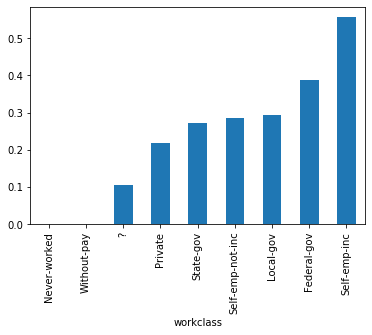

In [19]:
#Income share plot
data.groupby('workclass')['income'].mean().sort_values().plot(kind='bar')

Insight from the plot
- 'Self-employment-incorporated' has the highest share of high-income earners (more than 50% of people in this workclass earn more than 50K). Occupations that belong in this workclass are trade, finance, insurance, and real estate. This workclass consists of around 3% of the US labor force.
- 'Private' workclass shows the second lowest share of high-income earners which represents the closest to the '?' workclass' high-income earner share.
- '?' workclass has the lowest share of high income earners. Less than 10% of people in the ? workclass are high-earners. 
- 'Never-worked' and 'Without-pay' workclasses show 0% of high-income earners.

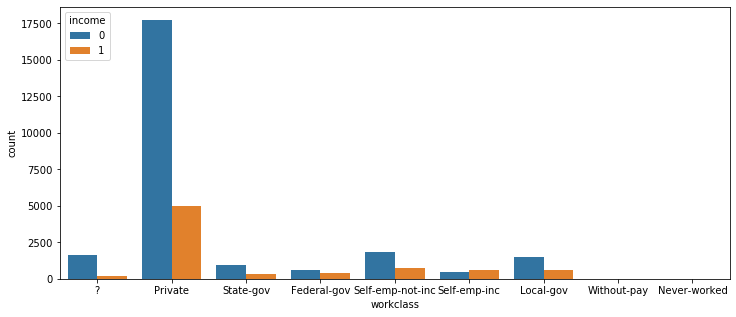

In [20]:
#Count plot
fig, ax = plt.subplots(1,1,figsize=(12,5))
sns.countplot(data=data, x='workclass', hue='income', ax=ax)
plt.show()

Insight:
- 'Private' workclass shows the highest number of people represented in the dataset.
- 'Without-pay' and 'Never-worked' both have very small number of observations in train dataset. Only 'Without-pay' workclass exists in test dataset.

Lets' find more about the 'Occupation' feature.

In [21]:
data.occupation.value_counts()

Prof-specialty       4140
Craft-repair         4099
Exec-managerial      4066
Adm-clerical         3770
Sales                3650
Other-service        3295
Machine-op-inspct    2002
?                    1843
Transport-moving     1597
Handlers-cleaners    1370
Farming-fishing       994
Tech-support          928
Protective-serv       649
Priv-house-serv       149
Armed-Forces            9
Name: occupation, dtype: int64

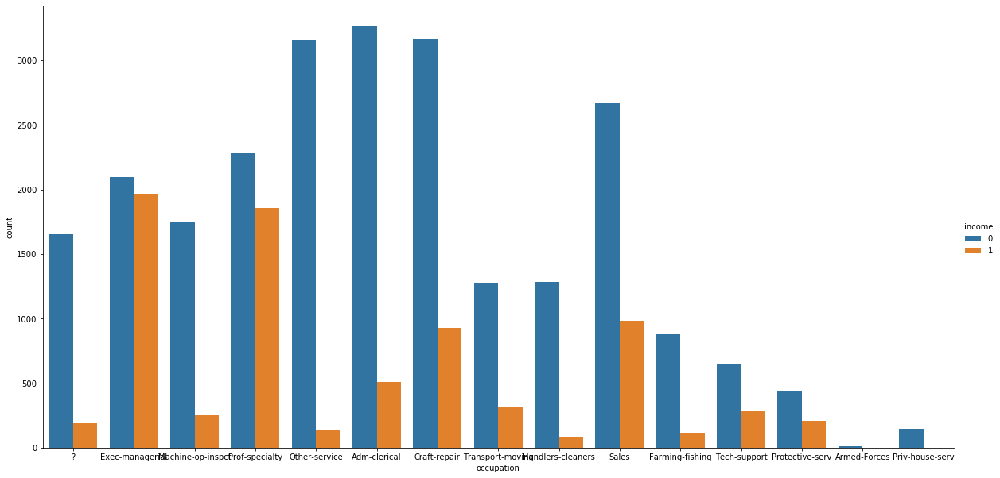

In [22]:
#count plot
sns.catplot(x='occupation', kind='count', hue='income', data=data, height=8.27, aspect=16.7/8.27)

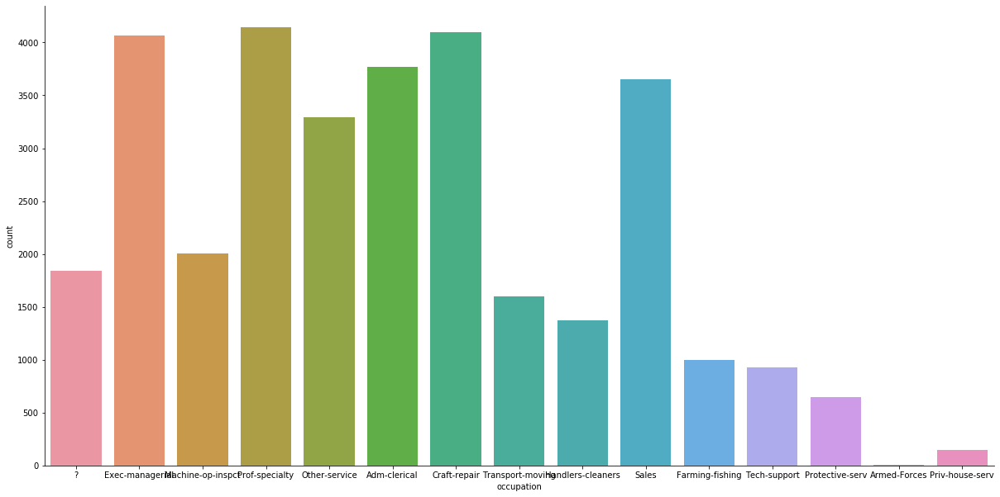

In [23]:
#Total count plot
sns.catplot(x='occupation', kind='count', data=data, height=8.27, aspect=16.7/8.27)

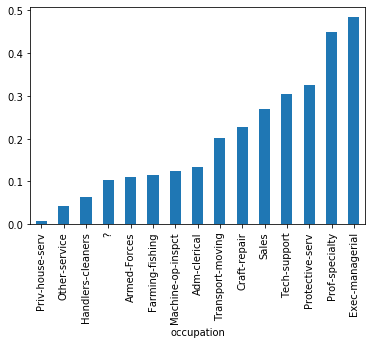

In [24]:
#income share plot
data.groupby('occupation')['income'].mean().sort_values().plot(kind='bar')

In [25]:
#Income share and count table
data.pivot_table(index='occupation',values='income',aggfunc=['mean','count'])

,mean,count
,income,income
occupation,,
?,0.103635,1843
Adm-clerical,0.134483,3770
Armed-Forces,0.111111,9
Craft-repair,0.226641,4099
Exec-managerial,0.484014,4066
Farming-fishing,0.115694,994
Handlers-cleaners,0.062774,1370
Machine-op-inspct,0.124875,2002


Insight:
- Almost half of the exec-managerial and professional specialty earn 50K or more.
- Most of private household service (e.g. house cleaning), other-service, and handlers-cleaners belong to the low income earners.

#### (4) Native.country feature

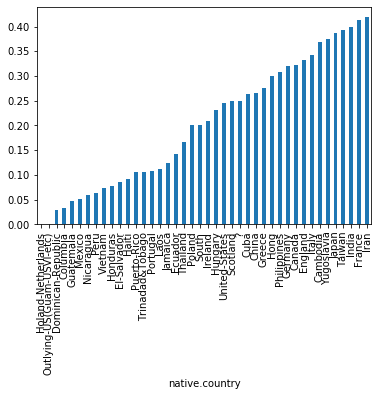

In [26]:
#income share plot
data.groupby('native.country')['income'].mean().sort_values().plot(kind='bar')

In [27]:
#Income share and count table
data.pivot_table(index='native.country',values='income',aggfunc=['mean','count'])

,mean,count
,income,income
native.country,,
?,0.250429,583
Cambodia,0.368421,19
Canada,0.322314,121
China,0.266667,75
Columbia,0.033898,59
Cuba,0.263158,95
Dominican-Republic,0.028571,70
Ecuador,0.142857,28


Insights:
- The mean income share of ? is around 0.25. Both China and U.S. show similar mean income share (Scotland: 0.25, U.S.: 0.25).
- The categories of 'Outlying-US(Guam-USVI-etc)' and 'Holland-Netherlands' show 0 mean income share. 

#### (5) Education and Education_num features

In [28]:
data.education.value_counts()

HS-grad         10501
Some-college     7291
Bachelors        5355
Masters          1723
Assoc-voc        1382
11th             1175
Assoc-acdm       1067
10th              933
7th-8th           646
Prof-school       576
9th               514
12th              433
Doctorate         413
5th-6th           333
1st-4th           168
Preschool          51
Name: education, dtype: int64

In [29]:
data['education.num'].value_counts()

9     10501
10     7291
13     5355
14     1723
11     1382
7      1175
12     1067
6       933
4       646
15      576
5       514
8       433
16      413
3       333
2       168
1        51
Name: education.num, dtype: int64

Insights:
- Two features show identical number of observations for corresponding category( e.g. HS-grad and education_num value of 9 showing both 10501 observations).

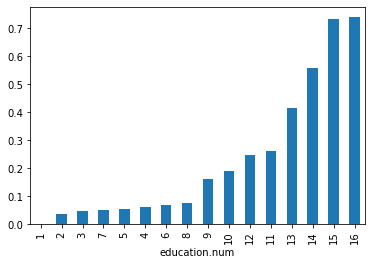

In [30]:
#income share plot
data.groupby('education.num')['income'].mean().sort_values().plot(kind='bar')

Insights:
- There is a very high correlation between the number of education and income. Higher education especially beyond high-school graduation credential shows much higher share of the high income earner status. For example, people with bachelors degree have mean income share of 0.41 versus 0.16 for those with high school graduate degree.
- Education.num can be a very good predictor of income.

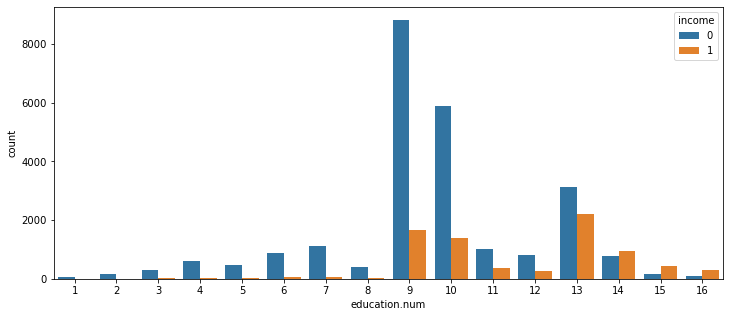

In [31]:
#count plot
fig, ax= plt.subplots(1,1,figsize=(12,5))
sns.countplot(data=data, x='education.num', hue='income',ax=ax)
plt.show()

Insights:
- High school graduates (value 9) and some-college (value 10) credential form the majority of the education.num feature.

#### (6) marital_status feature

In [32]:
data['marital.status'].value_counts()

Married-civ-spouse       14976
Never-married            10683
Divorced                  4443
Separated                 1025
Widowed                    993
Married-spouse-absent      418
Married-AF-spouse           23
Name: marital.status, dtype: int64

Details about the data:
- married civ spouse = married spouse is a civilian
- married af spouse = married spouse is in armed forces

In [33]:
#income share and count table
data.pivot_table(index='marital.status',values='income',aggfunc=['mean','count'])

,mean,count
,income,income
marital.status,,
Divorced,0.104209,4443
Married-AF-spouse,0.434783,23
Married-civ-spouse,0.446848,14976
Married-spouse-absent,0.081340,418
Never-married,0.045961,10683
Separated,0.064390,1025
Widowed,0.085599,993


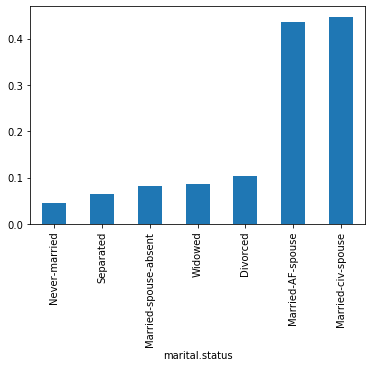

In [34]:
#income share plot
data.groupby('marital.status')['income'].mean().sort_values().plot(kind='bar')

Insights:
- Married-civ-spouse has the most number of observations followed by Never-married. 
- Married-AF-spouse only has 23 observations. Its mean income share of 0.43 is close to that of married-civ-spouse (0.45).
- All other categories show substantially lower mean income share. 'Never-married' category shows the lowest mean income share out of all. Being single doesn't help to become a high income earner on average.
- 'Married-civ-spouse' category within 'marital.status' feature can be a good predictor of income.

#### (7) capital.gain and capital.loss features

In [35]:
data['capital.gain'].describe(percentiles=[.99])

count    32561.000000
mean      1077.648844
std       7385.292085
min          0.000000
50%          0.000000
99%      15024.000000
max      99999.000000
Name: capital.gain, dtype: float64

Insights:
- capital.gain shows large outlier values such as 99999.

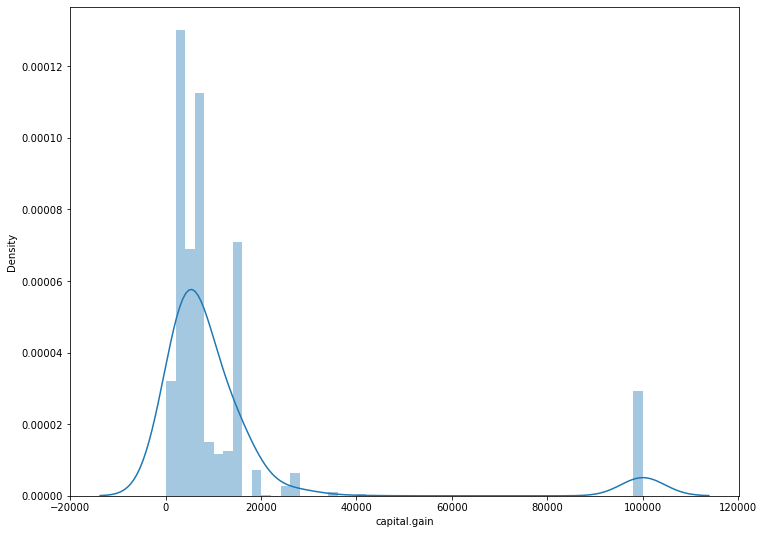

In [36]:
plt.figure(figsize=(12,9))
sns.distplot(data.loc[data['capital.gain']>0, 'capital.gain'])

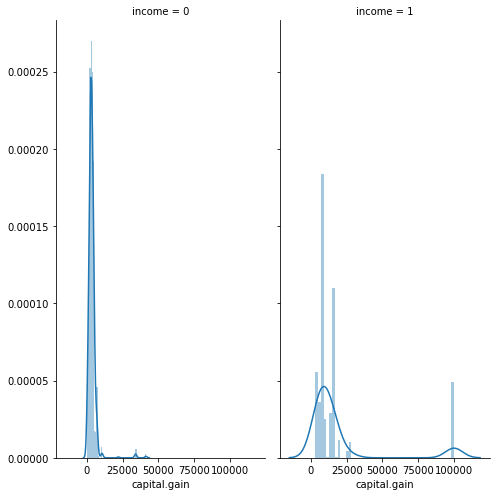

In [37]:
# Capital Gain vs. income group disribution
facet=sns.FacetGrid(data.loc[data['capital.gain']>0], col='income',height=7,aspect=0.5)
facet.map(sns.distplot, 'capital.gain')

Insights:
- The income below 50K group on the left shows mostly 0 capital gain. The majority data shows capital gain below 10k.
- The income above 50K group on the right shows a wide distribution of capital gains with peaks around 10-20K and 100K. 

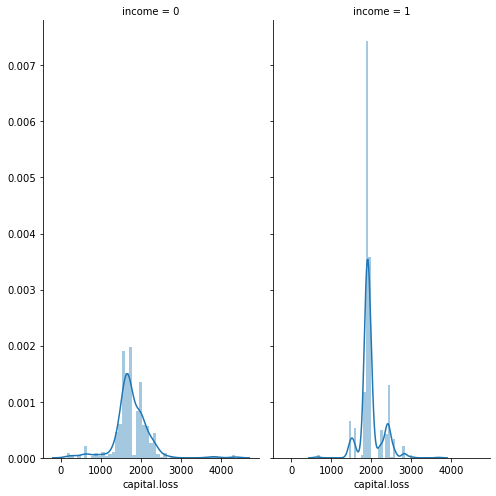

In [38]:
# Capital loss vs. income group disribution
facet=sns.FacetGrid(data.loc[data['capital.loss']>0], col='income',height=7,aspect=0.5)
facet.map(sns.distplot, 'capital.loss')

Insights:
- The income below 50K group on the left shows relatively wider distribution from 1000 to 3000.
- The income abvoe 50K group on the right shows a relatively narrower distribution with the peak around 2000.

#### (8) Race feature

In [39]:
#income share and count table
data.pivot_table(index='race',values='income',aggfunc=['mean','count'])

,mean,count
,income,income
race,,
Amer-Indian-Eskimo,0.115756,311
Asian-Pac-Islander,0.265640,1039
Black,0.123880,3124
Other,0.092251,271
White,0.255860,27816


Insights:
- White has the substantial majority of observations.
- Both Asian and White show substantially higher mean income share compared to other categories.

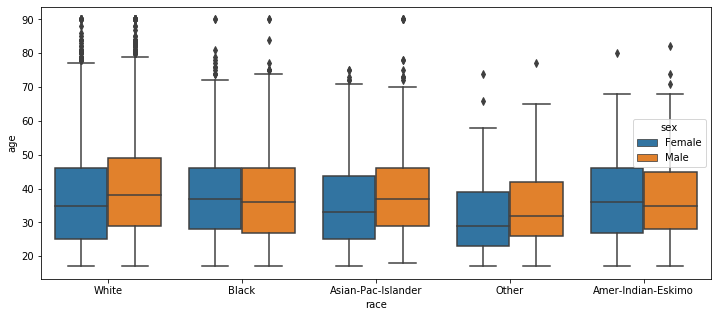

In [40]:
#Interaction between race and age
fig, ax = plt.subplots(1,1,figsize=(12,5))
sns.boxplot(data=data, x='race', y='age', hue='sex')

Insights:
- Median age across different race categories show similar range. Other category shows slightly lower median age compared to others.

In [41]:
# Race and Sex vs. Mean Income distribution
data.groupby(['race', 'sex'])[['income']].mean().style.background_gradient(cmap='Purples')

Insights:
- Both White and Asian categories show substantial difference in mean income share between male and female.

#### (9) Sex feature

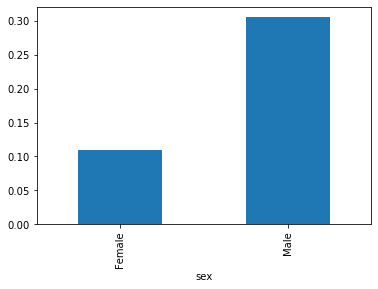

In [42]:
#income share plot
data.groupby('sex')['income'].mean().sort_values().plot(kind='bar')

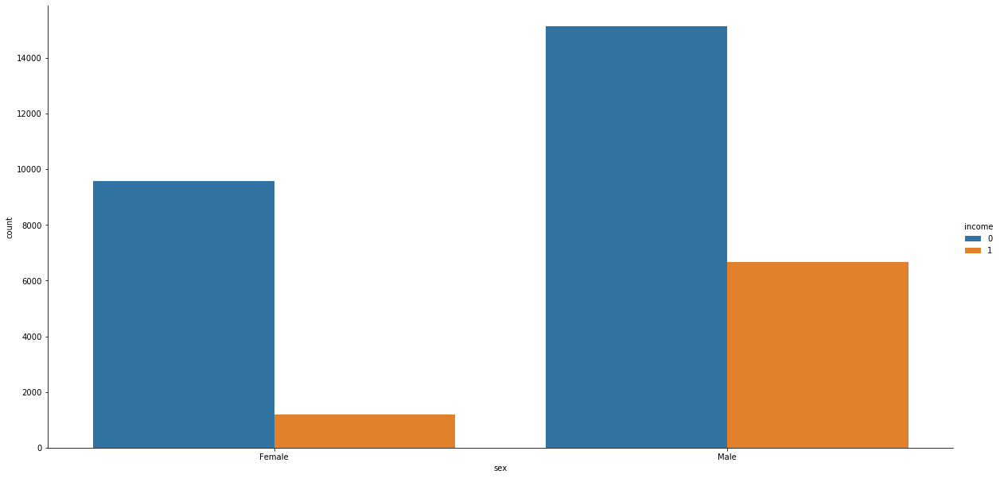

In [43]:
#count plot
sns.catplot(x='sex', kind='count', hue='income', data=data, height=8.27, aspect=16.7/8.27)

Insights: 
- There is substantial difference between mean income shares of male (0.3) versus female (0.11). 
- There are almost twice as many males compared to females in train dataset.


#### (10) Hours per week feature

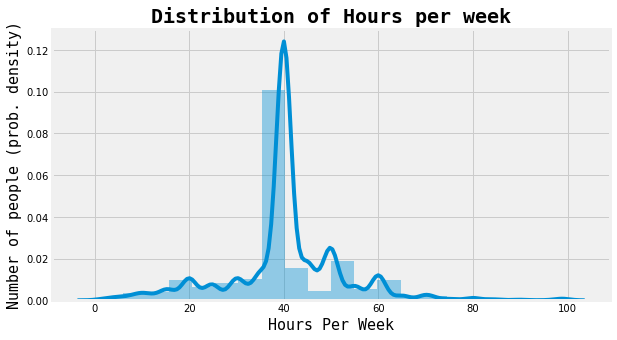

In [44]:
# Creating a distribution plot for 'hours per week'
plt.figure(figsize=(10, 5))
plt.style.use('fivethirtyeight')
sns.distplot(data['hours.per.week'], bins=20)
plt.title('Distribution of Hours per week', fontdict={
          'fontname': 'Monospace', 'fontsize': 20, 'fontweight': 'bold'})
plt.xlabel('Hours Per Week', fontdict={'fontname': 'Monospace', 'fontsize': 15})
plt.ylabel('Number of people (prob. density)', fontdict={
           'fontname': 'Monospace', 'fontsize': 15})
plt.tick_params(labelsize=10)
plt.show()


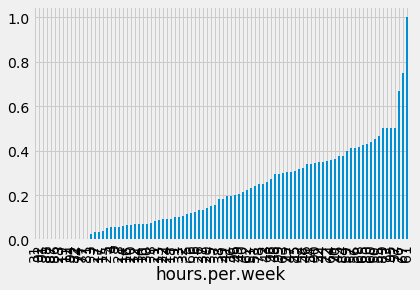

In [45]:
#income share plot
data.groupby('hours.per.week')['income'].mean().sort_values().plot(kind='bar')

Insights:
- The majority of people in the dataset works around 40 hours per week. 
- There is a high correlation between hours per week and mean income share.
- Hours per week can be a good predictor of income.

#### (11) fnlwgt feature

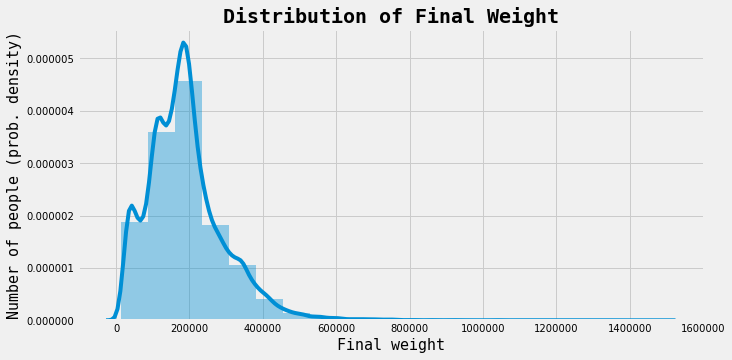

In [46]:
# Creating a distribution plot for 'fnlwgt'
plt.figure(figsize=(10, 5))
plt.style.use('fivethirtyeight')
sns.distplot(data['fnlwgt'], bins=20)
plt.title('Distribution of Final Weight', fontdict={
          'fontname': 'Monospace', 'fontsize': 20, 'fontweight': 'bold'})
plt.xlabel('Final weight', fontdict={'fontname': 'Monospace', 'fontsize': 15})
plt.ylabel('Number of people (prob. density)', fontdict={
           'fontname': 'Monospace', 'fontsize': 15})
plt.tick_params(labelsize=10)
plt.show()

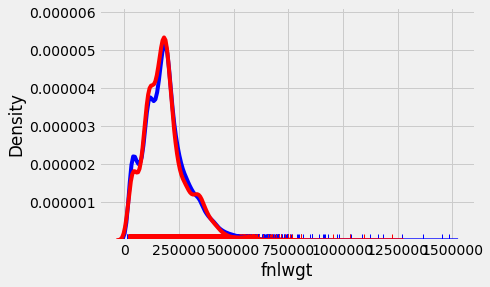

In [47]:
#fnlwgt vs. income distribution
df1 = data.loc[data['income']==0, 'fnlwgt']
df2 = data.loc[data['income']==1, 'fnlwgt']
sns.distplot(df1, kde=True, rug=True, hist=False, color='blue')
sns.distplot(df2, kde=True, rug=True, hist=False, color='red')

Insights:
- Most final weights fall between 0 and 0.5 (*1e6)
- The fnlwgt distribution between two income groups (above 50K vs. at or below 50K) look very similar to each other.
- The feature's variance is too large. Standardization can be considered to get the benefit of good fit.

#### (12) Correlation among features

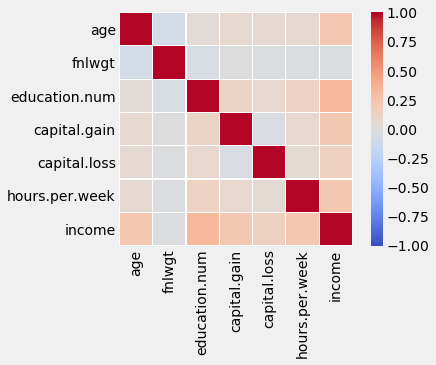

In [48]:
corr=data.corr()
sns.heatmap(corr, square=True, linecolor='white', linewidth=0.1,
            cmap='coolwarm', vmax=1, vmin=-1)

Insights:
- Income has relatively high correlation with age, number of years of education, and hours per week.

## 3. Data Preprocessing Part 1 (handling missing values and outliers)

#### On 'workclass' feature
To do:
- The 'Private' workclass is the most frequent workclass and its share of high-income earners are the closest to that of '?'. Therefore, replace '?' workclass with 'Private' workclass. 
- 'Without-pay' and 'Never-worked' workclasses also show no share of high-income earners. Combine both workclasses into one 'Without-pay' category to avoid overfitting.

In [49]:
#Workclass: Combine '?' with 'Private' (the most frequent category)
data.loc[(data.workclass=='?'), 'workclass'] = 'Private'

#Combine 'never-worked' with 'without-pay'
data.loc[(data.workclass=='Never-worked'), 'workclass'] = 'Without-pay'

#### On 'occupation' feature
To do: 
- Replace the 7 observations of ? values in 'occupation' that also have the 'Never-worked' values in 'workclass' feature with the category that shows 0 or very close to 0 mean income share which is the 'priv-house-serve' (0.007 mean income) category.
- For the rest of ? observations (1836 observations), replace them with 'Farming-fishing' category (mean income share: 0.12 for Farming-fishing vs. 0.1 for ?) which has the closest mean income value to that of ? in order to avoid overfitting.

In [50]:
# Assign 'Priv-house-serv' occupation to 7 ? values that also contain the 'Never-worked' values in workclass
data.loc[(data.workclass=='Never-worked') & (data.occupation=='?'), 'occupation']='Priv-house-serv'

# Combine the rest of ? values with 'Farming-fishing'
data.loc[(data.occupation=='?'), 'occupation']='NA'

#### On 'native.country' feature
To do:
- Since the majority of values in native_country feature is the 'United-States' and both ? and U.S. have similar mean income share, replace ? with 'United-States'.
- Combine the native.country categories with 0 mean income share into one NA category to avoid overfitting.

In [51]:
# Replace ? with 'United-States'
data.loc[(data['native.country']=='?'), 'native.country'] = 'United-States'

# NA category for native_country with 0 mean income share.
native_country_NA = ['Outlying-US(Guam-USVI-etc)','Holand-Netherlands']
data['native.country'] = data['native.country'].apply(lambda x: 'NA' if x in native_country_NA else x)

#### On 'education' feature
To do:
- We can simply drop 'education' feature and use just 'education.num' feature as it would be easier to work with numerical feature for modeling in later stage.

In [52]:
 #Drop the 'education' feature
del data['education']

#### On 'marital.status' feature
To do:
- Replace 'Married-AF-spouse' category with 'Married-civ-spouse' as the 'Married-AF-spouse' category has very small number of observations. Convert it to the mode value ('Married-civ-spouse').

In [53]:
data.loc[data['marital.status']=='Married-AF-spouse', 'marital.status']='Married-civ-spouse'

#### On 'capital.gain', 'capital.loss' features
To do:
- Create a new variable 'capital_net' to represent the net capital gain (capital gain - capital loss).
- Drop the 'capital.gain' and 'capital.loss' features.

In [54]:
# capital net = capital gain - capital loss
data['capital_net'] = data['capital.gain'] - data['capital.loss']

#drop the two features
del data['capital.gain']
del data['capital.loss']

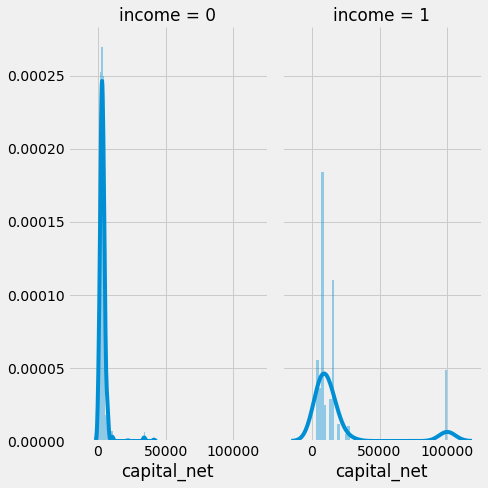

In [55]:
# Net capital gain vs. income group disribution
facet=sns.FacetGrid(data.loc[data['capital_net']>0], col='income',height=7,aspect=0.5)
facet.map(sns.distplot, 'capital_net')

Insights:
- Similar to the capital.gain plot, the income below 50K group on the left shows mostly modest net capital gain of 0 to 10K.
- Similar to the capital.gain plot, the income above 50K group on the right shows a wide distribution of net capital gains with peaks around 10-20K and 100K. 


## 3. Data preprocessing part 2 (data encoding & scaling)

In [56]:
data.dtypes.index, data.dtypes

(Index(['age', 'workclass', 'fnlwgt', 'education.num', 'marital.status',
        'occupation', 'relationship', 'race', 'sex', 'hours.per.week',
        'native.country', 'income', 'capital_net'],
       dtype='object'),
 age                int64
 workclass         object
 fnlwgt             int64
 education.num      int64
 marital.status    object
 occupation        object
 relationship      object
 race              object
 sex               object
 hours.per.week     int64
 native.country    object
 income             int64
 capital_net        int64
 dtype: object)

Based on the data type analysis for each feature (object versus integer), encode the object columns so that they can be used in models. Use Label Encoder in the sklearn preprocessing library.

In [57]:
from sklearn.preprocessing import LabelEncoder

for col in data.columns:
    if data[col].dtypes == 'object':
        encoder = LabelEncoder()
        data[col] = encoder.fit_transform(data[col])

In [58]:
data.head()

,age,workclass,fnlwgt,education.num,marital.status,occupation,relationship,race,sex,hours.per.week,native.country,income,capital_net
0,90,2,77053,9,5,7,1,4,0,40,37,0,-4356
1,82,2,132870,9,5,3,1,4,0,18,37,0,-4356
2,66,2,186061,10,5,7,4,2,0,40,37,0,-4356
3,54,2,140359,4,0,6,4,4,0,40,37,0,-3900
4,41,2,264663,10,4,10,3,4,0,40,37,0,-3900


Split the dataset into X (all the independent features) and target (dependent feature 'Income'). Drop the 'income' feature from X.

In [59]:
target = data.income
X = data.drop('income', axis=1)

Perform feature selection to find each feature's importance by using the ExtraTreesClassifier. This helps to solve the problem of overfitting and multicollinearity.

In [62]:
from sklearn.ensemble import ExtraTreesClassifier
selector = ExtraTreesClassifier(random_state = 10)

selector.fit(X, target)
feature_imp = selector.feature_importances_

for index, val in enumerate(feature_imp):
    print(index, round((val*100), 2))

0 15.3
1 4.08
2 16.57
3 12.92
4 7.78
5 7.75
6 8.94
7 1.39
8 2.75
9 9.5
10 1.51
11 11.49


In [63]:
X.columns

Index(['age', 'workclass', 'fnlwgt', 'education.num', 'marital.status',
       'occupation', 'relationship', 'race', 'sex', 'hours.per.week',
       'native.country', 'capital_net'],
      dtype='object')

Drop the features with less importances.

In [64]:
X = X.drop(['workclass', 'race', 'sex', 'native.country'], axis=1)

## Checking for multicollinearity - Correlation among features
- When using regresion coefficients to make business decisions, we must remove the effect of multicollinearity to obtain reliable regression coefficients. A and B show weak negative correlation of -0.19. Therefore, both variables can be kept in the model.

In [ ]:
corr=X.corr()
sns.heatmap(corr, square=True, linecolor='white', linewidth=0.1, cmap='coolwarm', vmax=1, vmin=-1)

Use StandardScaler to standardize the dataset by scaling the features so that the mean becomes 0 and the standard deviation becomes 1. If the variance within a feature is too large, it's hard to reflect the impact that feature has on the target variable.

In [65]:
# Standard scaling
from sklearn.preprocessing import StandardScaler

#reshape(-1,1) transforms X[col].values to [the length of the array,1]
    #e.g. x=shape(3,4), x.reshape(-1,1) transforms it to shape(12,1)
for col in X.columns:
    scaler = StandardScaler()
    X[col] = scaler.fit_transform(X[col].values.reshape(-1,1))

In [66]:
X.describe()

,age,fnlwgt,education.num,marital.status,occupation,relationship,hours.per.week,capital_net
count,3.256100e+04,3.256100e+04,3.256100e+04,3.256100e+04,3.256100e+04,3.256100e+04,3.256100e+04,3.256100e+04
mean,-3.666078e-17,-1.008172e-16,1.466431e-16,-2.269477e-17,3.142353e-17,-3.666078e-17,-2.793203e-17,7.681307e-17
std,1.000015e+00,1.000015e+00,1.000015e+00,1.000015e+00,1.000015e+00,1.000015e+00,1.000015e+00,1.000015e+00
min,-1.582206e+00,-1.681631e+00,-3.529656e+00,-1.352633e+00,-1.489193e+00,-9.001808e-01,-3.194030e+00,-7.216138e-01
25%,-7.757679e-01,-6.816910e-01,-4.200596e-01,-5.792555e-01,-7.984776e-01,-9.001808e-01,-3.542945e-02,-1.336701e-01
50%,-1.159546e-01,-1.082193e-01,-3.136003e-02,-5.792555e-01,-1.077619e-01,-2.778050e-01,-3.542945e-02,-1.336701e-01
75%,6.904838e-01,4.478765e-01,7.460392e-01,9.675001e-01,8.131923e-01,9.669466e-01,3.695194e-01,-1.336701e-01
max,3.769612e+00,1.226856e+01,2.300838e+00,2.514256e+00,1.734147e+00,2.211698e+00,4.742967e+00,1.336352e+01


- The target value 'income' is highly imbalanced as the number of observations with income at or less than equal to 50k comprises of 76% of the dataset. The unbalanced dataset would result in a low F1 score as models would have difficulty in learning the pattern of each class label. 
- Solve this by performing oversampling using RandomOverSampler which randomly selectS and replicateS the data points of the under-represented class label. 

In [67]:
round(target.value_counts(normalize=True)*100, 2).astype('str')+ ' %'

0    75.92 %
1    24.08 %
Name: income, dtype: object

In [77]:
from imblearn.over_sampling import RandomOverSampler 
ros = RandomOverSampler(random_state = 10)

ros.fit(X, target)
X_resampled, target_resampled = ros.fit_resample(X, target)
round(target_resampled.value_counts(normalize=True)*100,2).astype('str')+ ' %'

1    50.0 %
0    50.0 %
Name: income, dtype: object

Split the dataset into training and testing data using the ratio 8:2. I'll use the train_test_split command.

In [78]:
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(X_resampled, target_resampled, test_size=0.2, random_state=10)

print('X_train shape:', X_train.shape)
print('X_test shape:', X_test.shape)
print('Y_train shape:', Y_train.shape)
print('Y_test shape:', Y_test.shape)

X_train shape: (39552, 8)
X_test shape: (9888, 8)
Y_train shape: (39552,)
Y_test shape: (9888,)


## 4. Data Modeling

In [82]:
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import precision_score, recall_score, classification_report, f1_score, confusion_matrix

In [137]:
#Decision tree
dt = DecisionTreeClassifier()
dt.fit(X_train, Y_train)  #fit x,y. 
Y_pred_dt = dt.predict(X_test)  

#Decision tree visualization. 
#from sklearn.tree import plot_tree
#fn=['age','fnlwgt', 'education.num', 'marital_status','occupation','relationship','hours.per.week','capital_net']
#cn='income'
#fig, axes = plt.subplots(nrows=1,ncols=1,figsize=(4,4),dpi=300)
#tree.plot_tree(dt, feature_names=fn, class_names=cn, filled=True);
#fig.savefig('decision_tree.png')

- Random forest is a supervised learning algorithm. It builds a 'forest' as it ensembles multiple decision trees trained with the 'bagging' method. Via bootstrapping, it creates multiple training data, then it creates multiple decision trees that simultaneously try to learn from the dataset independent of each other. For the final prediction, it uses majority voting rule to aggregate the results for classification problem.
- Two key ideas are bagging and random subspace. 
    - Bagging (or bootstrap aggregating) aggregates the modesl created from each boostrap sample. Each model uses different training dataset (also called boostrap set) after boostrapping samples data with replacement.
    - Random subspace indicates that at each decision tree split node, the model would only consider a limited number of random features instead of the full list of features.

- Random forests address the problem of overfitting by combining the results of multiple decision trees. This method is more complex and computationaly costly than simple decision tree method though.

- Important parameters include max_depth, max_features, n_estimators, and min_sample_leaf. 
    - Max_depth indicates the maximum depth of the decision trees. Default value is None, indicating that the model would make trees until all leafs are 'pure' (the state at which the data belonging to one leaf would have the same class).
    - Max_features determines the maximum number of features the random forest can use in each individual tree. Higher value uses decision trees that are similar to each other, thus reducing the randomness of each tree and prevent overfitting. Lower value result in differentiated decision trees, and each tree would have more depth to fit the data. Following values are recommended:
        - For classification: sqrt(num of features)
        - For regression: (num of features)/3
        - Option: auto (no limit), sqrt (sqrt(num of features), log2 (log2(num of features))
    - N_estimators defines the number of trees used to build the model. Default value is 10. In order to satisfy the strong law of large number, usually large number (above 2000) decision trees are needed.
    - Min_sample_leaf determines the minimum number of samples required at leaf node. Default is 2, indicating that internal node before the split would have 2 or more data. If this value is too large, there is a possibility of underfitting.

In [119]:
#Random Forest Classifier:
rf = RandomForestClassifier(random_state=10)
rf.fit(X_train, Y_train)
Y_pred_rf = rf.predict(X_test)

## 5. Model Evaluation
- Using two metrics (accuracy_score and f1_score), I'll evaluate the models built above. 
- Accuracy score is the ratio of correctly predicted observations to the total predicted observations, thus it gives a sense of how accurate the prediction is. High precision relates to the low false positive rate.
- Recall (sensitivity) is the ratio of correctly predicted positive observations to the all observations in actual class which is 1. The question recall answers is: Of all the high income earners (above 50k), how many did we label?
- F1 score is the weighted average of precision and recall. Therefore, it takes both false positive and false negatives into account. F1 is more useful than accuracy especially if there is an uneven class distribution. F1 score = 2$*(recall$*precision) / (recall + precision)

In [88]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score

print('Decision tree:')
print('Accuracy score:', round(accuracy_score(Y_test,Y_pred_dt)*100,2))
print('F1 score:', round(f1_score(Y_test,Y_pred_dt)*100,2))
print('-'*30)
print('Random Forest Classifier:')
print('Accuracy score:', round(accuracy_score(Y_test,Y_pred_rf)*100,2))
print('F1 score:', round(f1_score(Y_test,Y_pred_rf)*100,2))

Decision tree:
Accuracy score: 92.14
F1 score: 92.54
------------------------------
Random Forest Classifier:
Accuracy score: 93.09
F1 score: 93.43


## 6. Hyperparameter Tuning
- Using RandomizedSearchCV, I'll tune the yperparameters of the random forest classifier model. This technique finds the best hyperparameters by using random hyperparameters at each iteration. If a value of 1000 random searching is given, each parameter would search for 1000 different values. I'll try to find the best values for parameters such as 'n_estimators' and 'max_depth'.
- Another way to improve the accuracy is to appropriately enlarge the number of trees when creating the random forest. However, note that if the number of trees goes beyond a certain level, the performance could actually decrease due to overfitting.

In [129]:
from sklearn.model_selection import RandomizedSearchCV

n_estimators = [int (x) for x in np.linspace(start=40, stop=150, num=15)]
max_depth = [int (x) for x in np.linspace(40,150, num=15)]
#max_features = [x for x in ['auto', 'sqrt', 'log2']]
#min_samples_leaf = [x for x in [1,2,5,10,15]]

param_dist = {
    'n_estimators' : n_estimators,
    'max_depth' : max_depth,
    #'max_features' : max_features,
    #'min_samples_leaf' : min_samples_leaf,
}

rf_tuned = RandomForestClassifier(random_state=10)
rf_cv = RandomizedSearchCV(estimator=rf_tuned, param_distributions=param_dist, cv=5, random_state=10)
rf_cv.fit(X_train, Y_train)
rf_cv.best_score_
rf_cv.best_params_

{'n_estimators': 102, 'max_depth': 71}

In [130]:
#Use the best parameters shown above. max_depth=71, n_estimators=102
rf_best = RandomForestClassifier(max_depth = 71, n_estimators=102, random_state=10)
rf_best.fit(X_train, Y_train)
Y_pred_rf_best = rf_best.predict(X_test)

print('Random Forest Classifier:')

print('Accuracy score:', round(accuracy_score(Y_test,Y_pred_rf_best)*100,2))
print('F1 score:', round(f1_score(Y_test,Y_pred_rf_best)*100,2))

Random Forest Classifier:
Accuracy score: 93.08
F1 score: 93.42


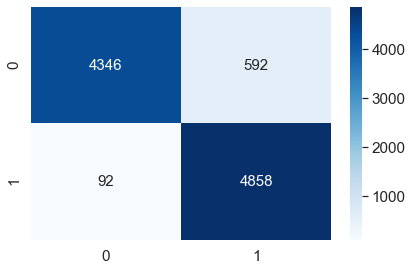

In [132]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(Y_test, Y_pred_rf_best)
sns.set(font_scale=1.4)
sns.heatmap(cm, annot=True, cmap='Blues',fmt='d', annot_kws={'size':15})
plt.show()

Insights:
- There are two possible predicted classes:'0' indicating income at or below 50k and '1' indicating income above 50k.
- The classifier made a total of 9888 predictions. The shape is rows: Actual 0 and 1, and columns: Predicted 0 and 1.
- Out of those 9888 cases, the classifier predicted '1' 5450 (592+4858) times, and '0' 4438 (4346+92) times. 
- In actual data, 4950 people (92+4858) in the sample have income above 50k and 4938 people (4346+592) do not.
- -----------------------------------------------------------------
- Accuracy: Overall, how often is the classifier correct?
    - (TP+TN)/total = (4858+4346)/9888 = 9204/9888 = 0.93
- Misclassification rate: Overall, how often is it wrong?
    - (FP+FN)/total = (92+592)/9888 = 684/9888 = 0.069
- Recall (sensitivity, true positive rate): When it's actually yes, how often does it predict yes?
    - TP/actual_yes = 4858/4950 = 0.98
- False positive rate: When it's actually no, how often does it predict yes?
    - FP/actual no = 592/4938 = 0.12
- True negative rate (specificity): When it's actually no, how often does it predict no?
    - TN/actual no = 4346/4938 = 0.88
- Precision: When it predicts yes, how often is it correct?
    - TP/predicted yes = 4858/5450 = 0.89
- Prevalence: How often does the '1' condition actually occur in our sample?
    - actual '1'/total = 4950/9888 = 0.5

In [133]:
from sklearn.metrics import classification_report
print(classification_report(Y_test, Y_pred_rf_best))

              precision    recall  f1-score   support

           0       0.98      0.88      0.93      4938
           1       0.89      0.98      0.93      4950

    accuracy                           0.93      9888
   macro avg       0.94      0.93      0.93      9888
weighted avg       0.94      0.93      0.93      9888



- After tuning the hyperparameters, the random forest model gives the best values for an accuracy score of 93.08 and f1 score of 93.42.

In [ ]:
#SAVING THE MODEL:

import joblib
joblib.dump(rf, 'census_income_prediction.pkl')

['census_income_prediction.pkl']

Saved the model